In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from mappymatch import package_root

import geopandas
import shapely
import plotly.express as px
import matplotlib.pyplot as plt

import folium

# Import the data

In [5]:
df = pd.read_csv('./../../Data_phone/unsup_labelled_data.csv', header=0, usecols=[6,7,8], names=['quality','lat','lon'])
df = df[['lat', 'lon', 'quality']]
df

,quality,lat,lon
0,1.0,46.899810,16.857534
1,1.0,46.899785,16.857527
2,1.0,46.899758,16.857519
3,1.0,46.899730,16.857511
4,1.0,46.899703,16.857503
...,...,...,...
2562,3.0,46.825737,16.829406
2563,3.0,46.825791,16.829311
2564,3.0,46.825845,16.829305
2565,3.0,46.825878,16.829328


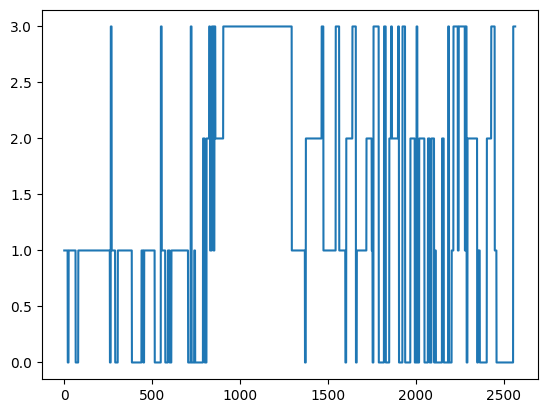

In [8]:
plt.plot(df['quality'])

# Map matching

- from LCSS example

In [9]:
from mappymatch.constructs.trace import Trace
from mappymatch.utils.plot import plot_trace

In [11]:
trace = Trace.from_dataframe(df, lat_column="lat", lon_column="lon", xy=True)
trace[:5]

Notice that we expect the input data to be in the EPSG:4326 coordinate reference system. 
If your input data is not in this format, you'll need to convert it prior to building a Trace object.

In order to idenfiy which coordinate is which in a trace, mappymatch uses the dataframe index as the coordinate index and so in this case, we just have a simple range based index for each coordinate.
We could set a different index on the dataframe and mappymatch would use that to identify the coordinates.

Now, let's load the trace from the same file:

Notice here that we pass three optional arguments to the `from_csv` function. 
By default, mappymatch expects the latitude and longitude columns to be named "latitude" and "longitude" but you can pass your own values if needed.
Also by default, mappymatch converts the trace into the web mercator coordinate reference system (EPSG:3857) by setting `xy=True`.
The LCSS matcher computes the cartesian distance between geometries and so a projected coordiante reference system is ideal.
In a future version of mappymatch we hope to support any projected coordiante system but right now we only support EPSG:3857.

Okay, let's plot the trace to see what it looks like (mappymatch uses folium under the hood for plotting):

In [33]:
mid_coord = trace.coords[int(len(trace) / 2)]
map = folium.Map(zoom_start=11, tiles="Cartodb Positron")

In [34]:
plot_trace(trace, point_color="black", line_color="yellow", m = map)
#or:
# plot_trace(trace, point_color="black", line_color="yellow")

Next, we need to get a road map to match our Trace to.
One way to do this is to build a small geofence around the trace and then download a map that just fits around our trace:

In [13]:
from mappymatch.constructs.geofence import Geofence

geofence = Geofence.from_trace(trace, padding=1e3)

Notice that we pass an optional argument to the constructor.
The padding defines how large around the trace we should build our geofence and is in the same units as the trace.
In our case, the trace has been projected to the web mercator CRS and so our units would be in approximate meters, 1e3 meters or 1 kilomter 

Now, let's plot both the trace and the geofence:

In [14]:
from mappymatch.utils.plot import plot_geofence

plot_trace(trace, point_color="black", m=plot_geofence(geofence))

At this point, we're ready to download a road network.
Mappymatch has a couple of ways to represent a road network: The `NxMap` and the `IGraphMap` which use `networkx` and `igraph`, respectively, under the hood to represent the road graph structure.
You might experiment with both to see if one is more performant or memory efficient in your use case.

In this example we'll use the `NxMap`:

In [15]:
from mappymatch.maps.nx.nx_map import NxMap, NetworkType

nx_map = NxMap.from_geofence(geofence, network_type=NetworkType.DRIVE)

The `from_geofence` constructor uses the osmnx package under the hood to download a road network.

Notice we pass the optional argument `network_type` which defaults to `NetworkType.DRIVE` but can be used to get a different network like `NetworkType.BIKE` or `NetworkType.WALK`

Now, we can plot the map to make sure we have the network that we want to match to:

In [16]:
from mappymatch.utils.plot import plot_map

plot_map(nx_map)

Now, we're ready to perform the actual map matching. 

In this example we'll use the `LCSSMatcher` which implements the algorithm described in this paper:

[Zhu, Lei, Jacob R. Holden, and Jeffrey D. Gonder.
"Trajectory Segmentation Map-Matching Approach for Large-Scale, High-Resolution GPS Data."
Transportation Research Record: Journal of the Transportation Research Board 2645 (2017): 67-75.](https://doi.org/10.3141%2F2645-08)

We won't go into detail here for how to tune the paramters but checkout the referenced paper for more details if you're interested. 
The default parameters have been set based on internal testing on high resolution driving GPS traces. 

In [17]:
from mappymatch.matchers.lcss.lcss import LCSSMatcher

matcher = LCSSMatcher(nx_map)

match_result = matcher.match_trace(trace)

Now that we have the results, let's plot them:

In [18]:
from mappymatch.utils.plot import plot_matches

plot_matches(match_result.matches)

Convert the matched route to a Dataframe:

In [35]:
#df = match_result.path_to_dataframe()
# convert the matches to a dataframe
df_matched = match_result.matches_to_dataframe()
df_matched.head()

,coordinate_id,distance_to_road,road_id,geom,origin_junction_id,destination_junction_id,road_key,kilometers,travel_time
0,0,2.115507,"(4386127969, 3037869870, 0)",LINESTRING (1876635.5530200484 5926239.5022474...,4386127969,3037869870,0,2.996113,119.8
1,1,2.032030,"(4386127969, 3037869870, 0)",LINESTRING (1876635.5530200484 5926239.5022474...,4386127969,3037869870,0,2.996113,119.8
2,2,1.934665,"(4386127969, 3037869870, 0)",LINESTRING (1876635.5530200484 5926239.5022474...,4386127969,3037869870,0,2.996113,119.8
3,3,1.826918,"(4386127969, 3037869870, 0)",LINESTRING (1876635.5530200484 5926239.5022474...,4386127969,3037869870,0,2.996113,119.8
4,4,1.714119,"(4386127969, 3037869870, 0)",LINESTRING (1876635.5530200484 5926239.5022474...,4386127969,3037869870,0,2.996113,119.8


In [36]:
# concat the quality column
df_matched['quality'] = df['quality']
df_matched.head()

,coordinate_id,distance_to_road,road_id,geom,origin_junction_id,destination_junction_id,road_key,kilometers,travel_time,quality
0,0,2.115507,"(4386127969, 3037869870, 0)",LINESTRING (1876635.5530200484 5926239.5022474...,4386127969,3037869870,0,2.996113,119.8,1.0
1,1,2.032030,"(4386127969, 3037869870, 0)",LINESTRING (1876635.5530200484 5926239.5022474...,4386127969,3037869870,0,2.996113,119.8,1.0
2,2,1.934665,"(4386127969, 3037869870, 0)",LINESTRING (1876635.5530200484 5926239.5022474...,4386127969,3037869870,0,2.996113,119.8,1.0
3,3,1.826918,"(4386127969, 3037869870, 0)",LINESTRING (1876635.5530200484 5926239.5022474...,4386127969,3037869870,0,2.996113,119.8,1.0
4,4,1.714119,"(4386127969, 3037869870, 0)",LINESTRING (1876635.5530200484 5926239.5022474...,4386127969,3037869870,0,2.996113,119.8,1.0


In [38]:
gdf = geopandas.GeoDataFrame(df_matched, geometry=df_matched.geom)
gdf.drop('geom', axis=1, inplace=True)
gdf.head()

,coordinate_id,distance_to_road,road_id,origin_junction_id,destination_junction_id,road_key,kilometers,travel_time,quality,geometry
0,0,2.115507,"(4386127969, 3037869870, 0)",4386127969,3037869870,0,2.996113,119.8,1.0,"LINESTRING (1876635.553 5926239.502, 1876616.7..."
1,1,2.032030,"(4386127969, 3037869870, 0)",4386127969,3037869870,0,2.996113,119.8,1.0,"LINESTRING (1876635.553 5926239.502, 1876616.7..."
2,2,1.934665,"(4386127969, 3037869870, 0)",4386127969,3037869870,0,2.996113,119.8,1.0,"LINESTRING (1876635.553 5926239.502, 1876616.7..."
3,3,1.826918,"(4386127969, 3037869870, 0)",4386127969,3037869870,0,2.996113,119.8,1.0,"LINESTRING (1876635.553 5926239.502, 1876616.7..."
4,4,1.714119,"(4386127969, 3037869870, 0)",4386127969,3037869870,0,2.996113,119.8,1.0,"LINESTRING (1876635.553 5926239.502, 1876616.7..."


In [200]:
from mappymatch.utils.geo import xy_to_latlon

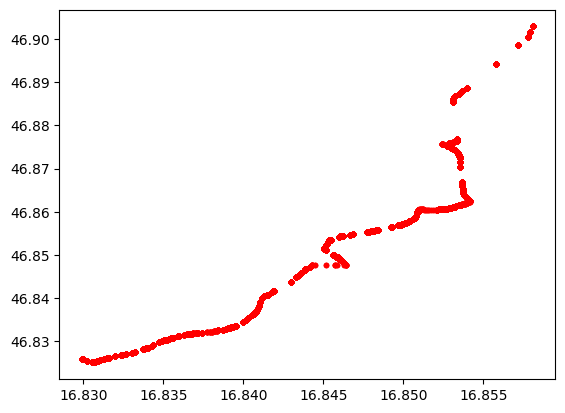

In [201]:
coords = xy_to_latlon(x = gdf.get_coordinates()['x'], y = gdf.get_coordinates()['y'])
df_coords = pd.DataFrame(coords).T
plt.plot(df_coords[1],df_coords[0], 'r.')

In [202]:
len(gdf['geometry'].unique())

52

In [203]:
len(df_coords[0].unique())

287

In [204]:
len(df_coords[0])

31119

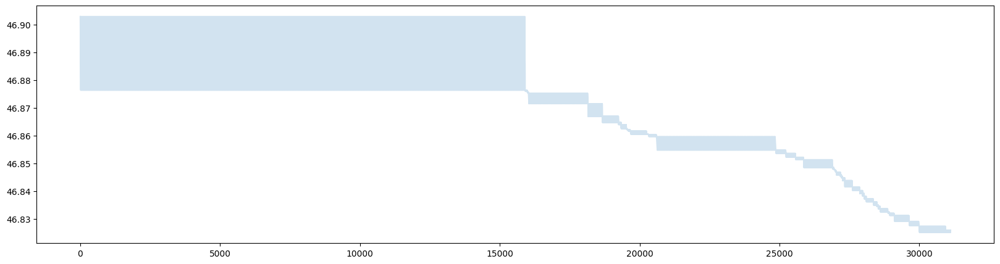

In [205]:
plt.figure(figsize=(20,5))
plt.plot(df_coords[0], alpha=0.2)

In [206]:
fig = px.scatter_mapbox(lat=df_coords[0], lon=df_coords[1], zoom=10, width=500, height=500 )
#fig.update_geos(scope='europe')
fig.update_geos(fitbounds="locations")
fig.update_layout(height=300, margin={"r":0,"t":0,"l":0,"b":0})
#fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(
    mapbox=dict(
    style="light", 
    accesstoken='pk.eyJ1Ijoicm9sYW5kbmFneSIsImEiOiJjbHRrZXptcWMweTJtMmlzNG40YjNmY3ozIn0.66tCRA-MiLLA-xAKcPiPlw',
    pitch=0,
    zoom=5
    )
)

fig.show()

In [207]:
gdf.crs = "epsg:3857"

## Split linestrings into segments

### Remove duplicates

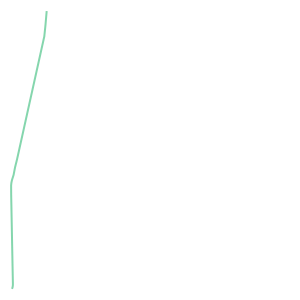

In [208]:
df_matched['geom'][0]

In [39]:
# remove duplicates
df_matched.drop_duplicates(subset = 'geom', inplace=True)
df_matched.head()

,coordinate_id,distance_to_road,road_id,geom,origin_junction_id,destination_junction_id,road_key,kilometers,travel_time,quality
0,0,2.115507,"(4386127969, 3037869870, 0)",LINESTRING (1876635.5530200484 5926239.5022474...,4386127969,3037869870,0,2.996113,119.8,1.0
884,884,8.245714,"(3037869870, 332042889, 0)","LINESTRING (1876095.408586821 5921911.9098511,...",3037869870,332042889,0,0.053792,2.2,2.0
898,898,3.951177,"(332042889, 16991489, 0)",LINESTRING (1876052.13870075 5921846.558829954...,332042889,16991489,0,0.042130,1.7,2.0
904,904,2.971743,"(16991489, 3039069189, 0)",LINESTRING (1876004.4605628431 5921807.4754724...,16991489,3039069189,0,0.051456,2.1,2.0
916,916,7.448576,"(3039069189, 2199900866, 0)",LINESTRING (1876037.0660416964 5921739.5359854...,3039069189,2199900866,0,0.429674,17.2,3.0


In [214]:
len(df_matched)

52

In [30]:
"""
# https://stackoverflow.com/questions/62053253/how-to-split-a-linestring-to-segments
from shapely.geometry import LineString, LinearRing
def segments(curve):
    return list(map(LineString, zip(curve.coords[:-1], curve.coords[1:])))

df_matched_new = pd.DataFrame()

for i in df_matched['geom']:
    df_matched_new = pd.concat([df_matched_new, pd.DataFrame([segments(i)]).T], ignore_index=True)

df_matched_new.columns = ['lstrings']

df_matched_new

gdf_new = geopandas.GeoDataFrame(df_matched_new, geometry=df_matched_new[0])
"""

### Split linestrings

In [40]:
# https://gis.stackexchange.com/questions/416284/splitting-multiline-or-linestring-into-equal-segments-of-particular-length-using

from shapely.geometry import LineString, Point, MultiPoint
from shapely.ops import split,snap

def cut(line, distance, lines):
     # Cuts a line in several segments at a distance from its starting point
     if distance <= 0.0 or distance >= line.length:
         return [LineString(line)]
     coords = list(line.coords)
     for i, p in enumerate(coords):
         pd = line.project(Point(p))
         if pd == distance:
             return [
                 LineString(coords[:i+1]),
                 LineString(coords[i:])
                 ]
         if pd > distance:
             cp = line.interpolate(distance)
             lines.append(LineString(coords[:i] + [(cp.x, cp.y)]))
             line = LineString([(cp.x, cp.y)] + coords[i:])
             if line.length > distance:
                 cut(line, distance, lines)
             else:
                 lines.append(LineString([(cp.x, cp.y)] + coords[i:]))
             return lines

In [79]:
df_splitted = pd.Series()
#df_splitted = []

# Iterate through every row (every linestring in the df)
distance_delta = 2
for i in range(len(df_matched)):
    line = df_matched['geom'].iloc[i]
    splitted = cut(line, distance_delta, list())
    df_splitted = pd.concat([df_splitted, pd.Series(splitted)], ignore_index=True)
    #df_splitted.extend(splitted)

df_splitted.columns = ['geom']
#gdf_splitted = geopandas.GeoDataFrame(df_splitted, geometry=df_splitted.geom, crs="EPSG:3857")
gdf_splitted = geopandas.GeoSeries(df_splitted, crs="EPSG:3857")

In [81]:
gdf_splitted

0       LINESTRING (1876635.553 5926239.502, 1876635.3...
1       LINESTRING (1876635.381 5926237.510, 1876635.2...
2       LINESTRING (1876635.209 5926235.517, 1876635.0...
3       LINESTRING (1876635.037 5926233.524, 1876634.8...
4       LINESTRING (1876634.865 5926231.532, 1876634.6...
                              ...                        
7033    LINESTRING (1873502.688 5913694.681, 1873501.7...
7034    LINESTRING (1873501.743 5913696.444, 1873500.7...
7035    LINESTRING (1873500.799 5913698.207, 1873499.8...
7036    LINESTRING (1873499.854 5913699.969, 1873498.9...
7037    LINESTRING (1873498.909 5913701.732, 1873498.0...
Length: 7038, dtype: geometry

In [284]:
len(df_splitted)

7038

In [289]:
gdf_splitted.to_crs(4326)['geometry'].centroid.x

/var/folders/w_/802pn39d4f75d8__y1zs9yxm0000gn/T/ipykernel_30208/1504143173.py:1: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.




0       16.858103
1       16.858102
2       16.858100
3       16.858099
4       16.858097
          ...    
7033    16.829957
7034    16.829948
7035    16.829940
7036    16.829931
7037    16.829923
Length: 7038, dtype: float64

In [84]:
# Combine lat and lon into a single array of coordinates
#coordinates = np.vstack((gdf_splitted.to_crs(4326)['geometry'].centroid.y, gdf_splitted.to_crs(4326)['geometry'].centroid.x)).T
coordinates = np.vstack((gdf_splitted.to_crs(4326).centroid.y, gdf_splitted.to_crs(4326).centroid.x)).T
coordinates

/var/folders/w_/802pn39d4f75d8__y1zs9yxm0000gn/T/ipykernel_83820/2883874266.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  coordinates = np.vstack((gdf_splitted.to_crs(4326).centroid.y, gdf_splitted.to_crs(4326).centroid.x)).T


array([[46.90289539, 16.85810323],
       [46.90288316, 16.85810168],
       [46.90287093, 16.85810014],
       ...,
       [46.82587794, 16.82993978],
       [46.82588878, 16.82993129],
       [46.82589895, 16.82992332]])

### Interpolate the quality column

In [47]:
from scipy.interpolate import griddata

In [85]:
# Prepare the known and unknown data points
known_points = np.vstack((df['lat'], df['lon'])).T
known_values = df['quality']
missing_points = coordinates

# Interpolate missing values using griddata
interpolated_quality = griddata(known_points, known_values, missing_points, method='nearest')

In [86]:
interpolated_quality

array([1., 1., 1., ..., 3., 3., 3.])

In [256]:
#gdf = geopandas.GeoDataFrame(df_splitted, geometry=df_splitted.geom, crs="EPSG:3857")

## Is there duplicates?

In [88]:
gdf_splitted

0       LINESTRING (1876635.553 5926239.502, 1876635.3...
1       LINESTRING (1876635.381 5926237.510, 1876635.2...
2       LINESTRING (1876635.209 5926235.517, 1876635.0...
3       LINESTRING (1876635.037 5926233.524, 1876634.8...
4       LINESTRING (1876634.865 5926231.532, 1876634.6...
                              ...                        
7033    LINESTRING (1873502.688 5913694.681, 1873501.7...
7034    LINESTRING (1873501.743 5913696.444, 1873500.7...
7035    LINESTRING (1873500.799 5913698.207, 1873499.8...
7036    LINESTRING (1873499.854 5913699.969, 1873498.9...
7037    LINESTRING (1873498.909 5913701.732, 1873498.0...
Length: 7038, dtype: geometry

In [150]:
gdf_new = geopandas.GeoDataFrame(pd.concat([gdf_splitted, pd.Series(interpolated_quality)], axis=1), geometry=0)
gdf_new.rename(columns={0:'geometry',1:'quality'}, inplace=True)
gdf_new.set_geometry('geometry', inplace=True)
gdf_new

,geometry,quality
0,"LINESTRING (1876635.553 5926239.502, 1876635.3...",1.0
1,"LINESTRING (1876635.381 5926237.510, 1876635.2...",1.0
2,"LINESTRING (1876635.209 5926235.517, 1876635.0...",1.0
3,"LINESTRING (1876635.037 5926233.524, 1876634.8...",1.0
4,"LINESTRING (1876634.865 5926231.532, 1876634.6...",1.0
...,...,...
7033,"LINESTRING (1873502.688 5913694.681, 1873501.7...",3.0
7034,"LINESTRING (1873501.743 5913696.444, 1873500.7...",3.0
7035,"LINESTRING (1873500.799 5913698.207, 1873499.8...",3.0
7036,"LINESTRING (1873499.854 5913699.969, 1873498.9...",3.0


In [151]:
gdf_new.iloc[0]

geometry    LINESTRING (1876635.5530200484 5926239.5022474...
quality                                                   1.0
Name: 0, dtype: object

## Geocoding

In [152]:
from shapely.geometry import LineString
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter

In [153]:
# Initialize the Nominatim geocoder
# Define the geocoding library
geolocator = Nominatim(user_agent="Nancy Amandi", timeout= 10) # define a general user
geocode = RateLimiter(geolocator.geocode, min_delay_seconds=1) # for stable workflow, define a delay between requests

In [157]:
# Function to get the address details for each LineString
def get_address_details(geometry):
    # Use the centroid of the LineString to get the address
    centroid = geometry.centroid
    coordinates = (centroid.y, centroid.x)
    logger.info(f"Geocoding coordinates: {coordinates}")
    location = geocode(coordinates)
    if location:
        return location.raw
    else:
        logger.warning(f"No address found for coordinates: {coordinates}")
        return None
"""
    
# Function to get the address details for each LineString
def get_address_details(geometry):
    # Use the centroid of the LineString to get the address
    centroid = geometry.centroid
    coordinates = (centroid.y, centroid.x)
    logger.info(f"Geocoding coordinates: {coordinates}")
    location = geocode(coordinates)
    if location:
        return {
            'class': location.raw.get('class'),
            'type': location.raw.get('type'),
            'display_name': location.raw.get('display_name')
        }
    else:
        logger.warning(f"No address found for coordinates: {coordinates}")
        return None
"""

In [155]:
# Apply the function to each row in the GeoDataFrame
gdf_new = gdf_new.iloc[:10].to_crs(epsg=4326)

In [158]:
gdf_new['address'] = gdf_new['geometry'].apply(get_address_details)

INFO:__main__:Geocoding coordinates: (46.90289538513407, 16.858103227172368)
INFO:__main__:Geocoding coordinates: (46.902883155400836, 16.858101681517102)
INFO:__main__:Geocoding coordinates: (46.90287092566481, 16.85810013586184)
INFO:__main__:Geocoding coordinates: (46.90285869592601, 16.858098590206573)
INFO:__main__:Geocoding coordinates: (46.90284646618441, 16.858097044551315)
INFO:__main__:Geocoding coordinates: (46.90283423644001, 16.85809549889605)
INFO:__main__:Geocoding coordinates: (46.902822006692844, 16.858093953240783)
INFO:__main__:Geocoding coordinates: (46.902809776942874, 16.858092407585517)
INFO:__main__:Geocoding coordinates: (46.902797547190104, 16.858090861930254)
INFO:__main__:Geocoding coordinates: (46.90278531743456, 16.858089316274988)


In [135]:
gdf_new['address'][0]

{'place_id': 54043163,
 'licence': 'Data © OpenStreetMap contributors, ODbL 1.0. http://osm.org/copyright',
 'osm_type': 'way',
 'osm_id': 563100122,
 'lat': '46.90289538513289',
 'lon': '16.85810322718177',
 'class': 'highway',
 'type': 'primary',
 'place_rank': 26,
 'importance': 0.05339086518654151,
 'addresstype': 'road',
 'name': '74',
 'display_name': '74, Egervár, Zalaegerszegi járás, Zala vármegye, Nyugat-Dunántúl, Dunántúl, 8913, Magyarország',
 'address': {'road': '74',
  'village': 'Egervár',
  'municipality': 'Zalaegerszegi járás',
  'county': 'Zala vármegye',
  'ISO3166-2-lvl6': 'HU-ZA',
  'region': 'Nyugat-Dunántúl',
  'postcode': '8913',
  'country': 'Magyarország',
  'country_code': 'hu'},
 'boundingbox': ['46.8761308', '46.9086852', '16.8530921', '16.8588350']}

In [ ]:
# important:
# class, type, display_name

In [122]:
gdf

,geometry,address,street_name,street_type
0,"LINESTRING (16.85810 46.90290, 16.85813 46.90292)","{'place_id': 53983618, 'licence': 'Data © Open...",None,None
1,"LINESTRING (16.85816 46.90294, 16.85818 46.90296)","{'place_id': 53983618, 'licence': 'Data © Open...",None,None


# ---> Upload SQL

### Test plot:

In [316]:
list(df_splitted['geom'])

[<LINESTRING (1876635.553 5926239.502, 1876635.381 5926237.51)>,
 <LINESTRING (1876635.381 5926237.51, 1876635.209 5926235.517)>,
 <LINESTRING (1876635.209 5926235.517, 1876635.037 5926233.524)>,
 <LINESTRING (1876635.037 5926233.524, 1876634.865 5926231.532)>,
 <LINESTRING (1876634.865 5926231.532, 1876634.693 5926229.539)>,
 <LINESTRING (1876634.693 5926229.539, 1876634.521 5926227.547)>,
 <LINESTRING (1876634.521 5926227.547, 1876634.349 5926225.554)>,
 <LINESTRING (1876634.349 5926225.554, 1876634.177 5926223.562)>,
 <LINESTRING (1876634.177 5926223.562, 1876634.004 5926221.569)>,
 <LINESTRING (1876634.004 5926221.569, 1876633.832 5926219.576)>,
 <LINESTRING (1876633.832 5926219.576, 1876633.66 5926217.584)>,
 <LINESTRING (1876633.66 5926217.584, 1876633.488 5926215.591)>,
 <LINESTRING (1876633.488 5926215.591, 1876633.316 5926213.599)>,
 <LINESTRING (1876633.316 5926213.599, 1876633.144 5926211.606)>,
 <LINESTRING (1876633.144 5926211.606, 1876632.972 5926209.613)>,
 <LINESTRING (

In [50]:
d = {'quality': interpolated_quality, 'geometry': list(gdf_splitted['geometry'])}

In [51]:
d

{'quality': array([1., 1., 1., ..., 3., 3., 3.]),
 'geometry': [<LINESTRING (1876635.553 5926239.502, 1876635.381 5926237.51)>,
  <LINESTRING (1876635.381 5926237.51, 1876635.209 5926235.517)>,
  <LINESTRING (1876635.209 5926235.517, 1876635.037 5926233.524)>,
  <LINESTRING (1876635.037 5926233.524, 1876634.865 5926231.532)>,
  <LINESTRING (1876634.865 5926231.532, 1876634.693 5926229.539)>,
  <LINESTRING (1876634.693 5926229.539, 1876634.521 5926227.547)>,
  <LINESTRING (1876634.521 5926227.547, 1876634.349 5926225.554)>,
  <LINESTRING (1876634.349 5926225.554, 1876634.177 5926223.562)>,
  <LINESTRING (1876634.177 5926223.562, 1876634.004 5926221.569)>,
  <LINESTRING (1876634.004 5926221.569, 1876633.832 5926219.576)>,
  <LINESTRING (1876633.832 5926219.576, 1876633.66 5926217.584)>,
  <LINESTRING (1876633.66 5926217.584, 1876633.488 5926215.591)>,
  <LINESTRING (1876633.488 5926215.591, 1876633.316 5926213.599)>,
  <LINESTRING (1876633.316 5926213.599, 1876633.144 5926211.606)>,
  <L

In [52]:
gdf_new = geopandas.GeoDataFrame(d, crs="EPSG:3857")

In [53]:
gdf_new

,quality,geometry
0,1.0,"LINESTRING (1876635.553 5926239.502, 1876635.3..."
1,1.0,"LINESTRING (1876635.381 5926237.510, 1876635.2..."
2,1.0,"LINESTRING (1876635.209 5926235.517, 1876635.0..."
3,1.0,"LINESTRING (1876635.037 5926233.524, 1876634.8..."
4,1.0,"LINESTRING (1876634.865 5926231.532, 1876634.6..."
...,...,...
7033,3.0,"LINESTRING (1873502.688 5913694.681, 1873501.7..."
7034,3.0,"LINESTRING (1873501.743 5913696.444, 1873500.7..."
7035,3.0,"LINESTRING (1873500.799 5913698.207, 1873499.8..."
7036,3.0,"LINESTRING (1873499.854 5913699.969, 1873498.9..."


In [102]:
import folium
import geopandas as gpd
import json
from shapely.geometry import mapping

# Assuming gdf is already defined
# Example gdf (replace with actual data)
# gdf = gpd.GeoDataFrame({
#     'geometry': [LineString([(0, 0), (1, 1)]), LineString([(2, 2), (3, 3)])],
#     'quality': [-4, -2]
# })

#gdf_to_plot = gdf.copy()
gdf_to_plot = gdf_new.copy()
# Reproject the GeoDataFrame to WGS 84 (lat/lon)
gdf_to_plot = gdf_to_plot.to_crs(epsg=4326)

# Function to extract coordinates from GeoSeries
def extract_coordinates(geometries):
    coordinates = [list(mapping(geom)['coordinates']) for geom in geometries if geom.geom_type == 'LineString']
    return coordinates

# Extract coordinates based on quality
perfect_coords = extract_coordinates(gdf_to_plot[gdf_to_plot['quality'] >= 3]['geometry'])
medium_coords = extract_coordinates(gdf_to_plot[(gdf_to_plot['quality'] < 3) & (gdf_to_plot['quality'] >= 1)]['geometry'])
bad_coords = extract_coordinates(gdf_to_plot[gdf_to_plot['quality'] == 0]['geometry'])

# Create the GeoJSON structure
states = {
    "type": "FeatureCollection",
    "features": [
        {
            "type": "Feature",
            "properties": {"party": "perfect"},
            "geometry": {
                "type": "MultiLineString",
                "coordinates": perfect_coords
            }
        },
        {
            "type": "Feature",
            "properties": {"party": "medium"},
            "geometry": {
                "type": "MultiLineString",
                "coordinates": medium_coords
            }
        },
        {
            "type": "Feature",
            "properties": {"party": "bad"},
            "geometry": {
                "type": "MultiLineString",
                "coordinates": bad_coords
            }
        }
    ]
}

# Save the GeoJSON data to a file
with open('states.json', 'w') as f:
    json.dump(states, f)

# Create a map centered on the USA
m = folium.Map(tiles="cartodbpositron")

# Define a function to style the features
def style_function(feature):
    return {
        'color': '#1ce375' if feature['properties']['party'] == 'perfect' else '#efe510' if feature['properties']['party'] == 'medium' else '#f1170e',
    }

# Add the GeoJSON layer to the map
folium.GeoJson(
    states,
    style_function=style_function
).add_to(m)

m.fit_bounds(m.get_bounds())
# If you want to display the map directly in a Jupyter Notebook, use:
m

In [ ]:
#######################################################
#ezzel a kóddal végigiterálni az összes line-stringen, így egyenlő távolságra fel tudom őket osztani!!!!
#######################################################

### Plot the splitted route:

In [282]:
import folium
import geopandas as gpd
import json
from shapely.geometry import mapping

# Assuming gdf is already defined
# Example gdf (replace with actual data)
# gdf = gpd.GeoDataFrame({
#     'geometry': [LineString([(0, 0), (1, 1)]), LineString([(2, 2), (3, 3)])],
#     'quality': [-4, -2]
# })

#gdf_to_plot = gdf.copy()
gdf_to_plot = esult.copy()
# Reproject the GeoDataFrame to WGS 84 (lat/lon)
gdf_to_plot = gdf_to_plot.to_crs(epsg=4326)

# Function to extract coordinates from GeoSeries
def extract_coordinates(geometries):
    coordinates = [list(mapping(geom)['coordinates']) for geom in geometries if geom.geom_type == 'LineString']
    return coordinates

# Extract coordinates based on quality
perfect_coords = extract_coordinates(gdf_to_plot[gdf_to_plot['quality'] < -2.5]['geometry'])
medium_coords = extract_coordinates(gdf_to_plot[(gdf_to_plot['quality'] < -2) & (gdf_to_plot['quality'] > -2.5)]['geometry'])
bad_coords = extract_coordinates(gdf_to_plot[gdf_to_plot['quality'] > -2]['geometry'])

# Create the GeoJSON structure
states = {
    "type": "FeatureCollection",
    "features": [
        {
            "type": "Feature",
            "properties": {"party": "perfect"},
            "geometry": {
                "type": "MultiLineString",
                "coordinates": perfect_coords
            }
        },
        {
            "type": "Feature",
            "properties": {"party": "medium"},
            "geometry": {
                "type": "MultiLineString",
                "coordinates": medium_coords
            }
        },
        {
            "type": "Feature",
            "properties": {"party": "bad"},
            "geometry": {
                "type": "MultiLineString",
                "coordinates": bad_coords
            }
        }
    ]
}

# Save the GeoJSON data to a file
with open('states.json', 'w') as f:
    json.dump(states, f)

# Create a map centered on the USA
m = folium.Map(tiles="cartodbpositron")

# Define a function to style the features
def style_function(feature):
    return {
        'color': '#1ce375' if feature['properties']['party'] == 'perfect' else '#efe510' if feature['properties']['party'] == 'medium' else '#f1170e',
    }

# Add the GeoJSON layer to the map
folium.GeoJson(
    states,
    style_function=style_function
).add_to(m)

m.fit_bounds(m.get_bounds())
# If you want to display the map directly in a Jupyter Notebook, use:
m


In [308]:
bad_coords

[[(16.858104, 46.90290149999999), (16.857935, 46.90156429999999)],
 [(16.857935, 46.90156429999999),
  (16.8577707, 46.9004794),
  (16.8571609, 46.89860059999999),
  (16.8557695, 46.89431379999999),
  (16.853953000000004, 46.88871659999999),
  (16.853687, 46.8879882),
  (16.8534738, 46.88723739999998),
  (16.85324, 46.8867265),
  (16.8531625, 46.886471399999984),
  (16.853125599999995, 46.8862152),
  (16.8531342, 46.885301),
  (16.8533767, 46.87678799999999),
  (16.8533729, 46.87669109999999),
  (16.8533555, 46.876591399999995),
  (16.8533287, 46.87648539999999),
  (16.8532874, 46.876394299999994),
  (16.8532518, 46.87633379999999)],
 [(16.858104, 46.90290149999999), (16.857935, 46.90156429999999)],
 [(16.857935, 46.90156429999999),
  (16.8577707, 46.9004794),
  (16.8571609, 46.89860059999999),
  (16.8557695, 46.89431379999999),
  (16.853953000000004, 46.88871659999999),
  (16.853687, 46.8879882),
  (16.8534738, 46.88723739999998),
  (16.85324, 46.8867265),
  (16.8531625, 46.8864713999

In [324]:
import folium
import geopandas as gpd
import json
import branca.colormap as cm
from shapely.geometry import mapping

# Original Leafletjs example:
# https://leafletjs.com/examples/geojson/



gdf_to_plot = gdf_new.copy()
# Reproject the GeoDataFrame to WGS 84 (lat/lon)
gdf_to_plot = gdf_to_plot.to_crs(epsg=4326)

# Create a linear colormap
linear_colormap = cm.LinearColormap(
    colors=['green', 'yellow', 'red', 'black'],
    vmin=gdf_to_plot['quality'].min(),
    vmax=gdf_to_plot['quality'].max(),
    index=[gdf_to_plot['quality'].min(), -3, -2, gdf_to_plot['quality'].max()],
    caption='Quality'
)
"""
# Function to extract coordinates from GeoSeries
def extract_coordinates(geometries):
    coordinates = [list(mapping(geom)['coordinates']) for geom in geometries if geom.geom_type == 'LineString']
    return coordinates

####################################
# Extract coordinates and assign them based on quality
features = []
for quality, group in gdf_to_plot.groupby('quality'):
    coords = extract_coordinates(group['geometry'])
    if coords:
        features.append({
            "type": "Feature",
            "properties": {"quality": quality},
            "geometry": {
                "type": "MultiLineString",
                "coordinates": coords
            }
        })
####################################
"""

def extract_coordinates(geometry):
    return list(mapping(geometry)['coordinates'])

# Extract coordinates and assign them based on quality
features = []
for idx, row in gdf_to_plot.iterrows():
    coords = extract_coordinates(row['geometry'])
    if coords:
        features.append({
            "type": "Feature",
            "properties": {"quality": row['quality']},
            "geometry": {
                "type": "LineString",
                "coordinates": coords
            }
        })



        

# Create the GeoJSON structure
states = {
    "type": "FeatureCollection",
    "features": features
}

# Save the GeoJSON data to a file
with open('states.json', 'w') as f:
    json.dump(states, f)

# Create a map centered on the USA
m = folium.Map(tiles="cartodbpositron")

# Define a function to style the features using the linear colormap
def style_function(feature):
    return {
        'color': linear_colormap(feature['properties']['quality']),
        'weight': 2,
        'opacity': 0.7,
    }

# Add the GeoJSON layer to the map
folium.GeoJson(
    states,
    style_function=style_function
).add_to(m)

# Add the colormap to the map
linear_colormap.add_to(m)

m.fit_bounds(m.get_bounds())

# If you want to display the map directly in a Jupyter Notebook, use:
m


In [367]:
features

[{'type': 'Feature',
  'properties': {'quality': 0.0},
  'geometry': {'type': 'LineString',
   'coordinates': [(16.858104, 46.90290149999999),
    (16.857935, 46.90156429999999)]},
  'id': '0'},
 {'type': 'Feature',
  'properties': {'quality': 0.0},
  'geometry': {'type': 'LineString',
   'coordinates': [(16.857935, 46.90156429999999),
    (16.8577707, 46.9004794),
    (16.8571609, 46.89860059999999),
    (16.8557695, 46.89431379999999),
    (16.853953000000004, 46.88871659999999),
    (16.853687, 46.8879882),
    (16.8534738, 46.88723739999998),
    (16.85324, 46.8867265),
    (16.8531625, 46.886471399999984),
    (16.853125599999995, 46.8862152),
    (16.8531342, 46.885301),
    (16.8533767, 46.87678799999999),
    (16.8533729, 46.87669109999999),
    (16.8533555, 46.876591399999995),
    (16.8533287, 46.87648539999999),
    (16.8532874, 46.876394299999994),
    (16.8532518, 46.87633379999999)]},
  'id': '1'},
 {'type': 'Feature',
  'properties': {'quality': 0.0},
  'geometry': {'typ

In [359]:
states['features'][205]['geometry']['coordinates']

[(16.857935, 46.90156429999999),
 (16.8577707, 46.9004794),
 (16.8571609, 46.89860059999999),
 (16.8557695, 46.89431379999999),
 (16.853953000000004, 46.88871659999999),
 (16.853687, 46.8879882),
 (16.8534738, 46.88723739999998),
 (16.85324, 46.8867265),
 (16.8531625, 46.886471399999984),
 (16.853125599999995, 46.8862152),
 (16.8531342, 46.885301),
 (16.8533767, 46.87678799999999),
 (16.8533729, 46.87669109999999),
 (16.8533555, 46.876591399999995),
 (16.8533287, 46.87648539999999),
 (16.8532874, 46.876394299999994),
 (16.8532518, 46.87633379999999)]

In [364]:
# Create a map centered on the USA
m = folium.Map(tiles="cartodbpositron")

# Add the GeoJSON layer to the map
folium.GeoJson(
    states['features'][52]
).add_to(m)

# Add the colormap to the map
linear_colormap.add_to(m)

m.fit_bounds(m.get_bounds())

# If you want to display the map directly in a Jupyter Notebook, use:
m

In [213]:
# Build a map with folium

m = folium.Map(tiles="cartodbpositron")
folium.GeoJson(
    gdf.drop('geom', axis=1),
    style_function=lambda feature: {
        "color": 'red',
    },
    
    ).add_to(m)

m.fit_bounds(m.get_bounds())

m

# LCSS Example

An example of using the LCSSMatcher to match a gps trace to the Open Street Maps road network

## Original example continoues

The `plot_matches` function plots the roads that each point has been matched to and labels them with the road id.

In some cases, if the trace is much sparser (for example if it was collected a lower resolution), you might want see the estimated path, rather than the explict matched roads.

For example, let's reduce the trace frequency to every 30th point and re-match it:

In [11]:
reduced_trace = trace[0::30]

In [12]:
plot_trace(reduced_trace, point_color="black", line_color="yellow")

In [13]:
reduced_matches = matcher.match_trace(reduced_trace)

In [14]:
plot_matches(reduced_matches.matches)

The match result also has a `path` attribute with the estiamted path through the network:

In [15]:
from mappymatch.utils.plot import plot_path

In [16]:
plot_trace(reduced_trace, point_color="blue", m=plot_path(reduced_matches.path, crs=trace.crs))

Lastly, we might want to convert the results into a format more suitible for saving to file or merging with some other dataset. 
To do this, we can convert the result into a dataframe:

In [19]:
result_df = reduced_matches.matches_to_dataframe()
result_df.head()

,coordinate_id,distance_to_road,road_id,geom,origin_junction_id,destination_junction_id,road_key,kilometers,travel_time
0,0,18.704781,"(432968976, 432968864, 0)",LINESTRING (-11679421.184827643 4815736.167510...,432968976,432968864,0,0.548364,28.2
1,30,6.637295,"(432968864, 176066679, 0)",LINESTRING (-11679700.006756231 4816391.715274...,432968864,176066679,0,0.713160,24.5
2,60,5.474720,"(176066679, 442605942, 0)",LINESTRING (-11680004.732730329 4817267.513675...,176066679,442605942,0,0.849680,29.2
3,90,6.923850,"(442615878, 442618319, 0)",LINESTRING (-11680833.539735131 4818830.551805...,442615878,442618319,0,0.424253,14.6
4,120,7.800845,"(442618319, 442617120, 0)",LINESTRING (-11681140.002293285 4819289.434003...,442618319,442617120,0,0.957480,34.5


Here, for each coordinate, we have the distance to the matched road, and then attributes of the road itself like the geometry, the OSM node id and the road distance and travel time.

We can also get a dataframe for the path:

In [20]:
path_df = reduced_matches.path_to_dataframe()
path_df.head()

,road_id,geom,origin_junction_id,destination_junction_id,road_key,kilometers,travel_time
0,"(432968976, 432968864, 0)",LINESTRING (-11679421.184827643 4815736.167510...,432968976,432968864,0,0.548364,28.2
1,"(432968864, 176066679, 0)",LINESTRING (-11679700.006756231 4816391.715274...,432968864,176066679,0,0.713160,24.5
2,"(176066679, 442605942, 0)",LINESTRING (-11680004.732730329 4817267.513675...,176066679,442605942,0,0.849680,29.2
3,"(442605942, 442615878, 0)",LINESTRING (-11680517.325589584 4818246.301911...,442605942,442615878,0,0.510778,17.6
4,"(442615878, 442618319, 0)",LINESTRING (-11680833.539735131 4818830.551805...,442615878,442618319,0,0.424253,14.6
